# Part 5: Spectral Entropy Analysis

In [41]:
# Add directory above current directory to path
import sys; 
if not ".." in sys.path:
    sys.path.insert(0, '..')
    
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_context("paper")
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import minmax_scale

sns.set(style="darkgrid")

from utils.data_utils import *
from utils.plot_utils import tsplot_periodogram
from utils.time_utils import *
from regularity_analysis.feature_extraction import fourier_spectrum_entropy, multiscale_entropy

%load_ext autoreload
%autoreload 2

#run this for fullscreen jupyter cells
#from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def prepare_result(customer_data, result_data):
    """
    Concatenate customer base frame with entropy result frame for quick Seaborn plot building
    """
    
    dfs = [customer_data, result_data]
    
    return pd.concat(dfs, axis=1)

In [3]:
#set up data and result paths
customer_base_path = "../DATA_GYM/sanitized_customer_base.csv"
login_data_path = "../DATA_GYM/sanitized_login_data.csv"
result_folder = "../results/regularity/statistics/2020-06-05/"

In [4]:
login_data = load_login_data(login_data_path)
customer_data = load_customer_data(customer_base_path)
customer_data

,ISACTIVE,EXPIRE_DATE,LAST_VISIT,CLASS_CODE,DATE_SAVED,DATE_LAST_MODIFIED,RENEW_DATE,PAUSE_START,PAUSE_END,BUSINESS_CODE,SEX,NO_MAIL,NO_SMS,MEMBER_SINCE,COMPANY_CUST_CODE,IS_DROP_IN_CUSTOMER,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS
CUST_CODE,,,,,,,,,,,,,,,,,,,
5152.10,False,2013-05-03,2013-04-16,10.10,2013-04-16 10:03:07,2013-09-26 16:14:18,1899-12-30,1899-12-30,1899-12-30,10.10,F,False,False,2013-02-04 00:00:00,NaN,False,88 days 00:00:00.000000000,71 days 00:00:00.000000000,1
4766.10,False,2013-05-19,2013-04-16,10.10,2013-04-16 10:03:17,2014-06-11 12:02:14,1899-12-30,1899-12-30,1899-12-30,10.10,F,False,False,2012-11-20 00:00:00,NaN,False,180 days 00:00:00.000000000,147 days 00:00:00.000000000,1
4674.10,False,2013-09-30,2013-04-16,10.10,2013-04-16 10:03:19,2014-06-11 12:02:15,1899-12-30,1899-12-30,1899-12-30,10.10,F,False,False,2012-11-01 00:00:00,NaN,False,333 days 00:00:00.000000000,166 days 00:00:00.000000000,1
9000130.90,False,2013-07-25,2013-04-16,10.90,2013-04-16 11:24:11,2013-09-26 16:18:43,1899-12-30,1899-12-30,1899-12-30,10.90,NaN,False,False,2012-09-18 00:00:00,NaN,False,310 days 00:00:00.000000000,210 days 00:00:00.000000000,1
2002108.30,False,2013-04-21,2013-04-16,10.30,2013-04-16 11:55:51,2014-09-22 15:02:53,1899-12-30,1899-12-30,1899-12-30,10.30,F,False,False,2012-11-21 00:00:00,NaN,False,151 days 00:00:00.000000000,146 days 00:00:00.000000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3007862.40,True,2100-12-31,NaT,10.40,2018-08-09 15:39:32,2018-09-10 09:25:45,NaT,NaT,NaT,10.40,F,False,False,2018-08-09 00:00:00,NaN,False,35 days 07:57:31.000000000,0 days 00:00:00.000000000,1
9005399.90,True,2018-10-08,NaT,10.90,2018-08-09 16:50:40,2018-09-10 09:25:33,NaT,NaT,NaT,10.90,M,False,False,2018-08-09 00:00:00,NaN,False,35 days 07:57:31.000000000,0 days 00:00:00.000000000,1
2355391.33,True,2100-12-31,NaT,10.33,2018-08-10 11:17:16,2018-09-10 09:25:55,NaT,NaT,NaT,10.33,F,False,False,2018-08-10 00:00:00,NaN,False,34 days 07:57:31.000000000,0 days 00:00:00.000000000,1


In [147]:
login_data

,ID,RES_ID,DATE_SAVED,DATE_LAST_MODIFIED,CUST_CODE,IS_ARRIVED,LOCATION,COMPUTED_RSV_ID,DATE,MONTH,WEEK,DAYOFWEEK
0,51742,50521,2013-04-16 10:47:58,2013-04-16 10:47:58,2079.10,T,10,1051742,2013-04-16,4,16,1
1,51743,50541,2013-04-16 11:39:41,2013-04-16 11:39:41,4032.10,T,10,1051743,2013-04-16,4,16,1
2,52517,49331,2013-04-16 14:25:41,2013-04-16 14:25:41,8002122.80,T,80,8052517,2013-04-16,4,16,1
3,52521,51993,2013-04-16 14:28:50,2013-04-16 14:28:50,4001177.50,T,50,5052521,2013-04-16,4,16,1
4,52523,49331,2013-04-16 14:32:15,2013-04-16 14:32:15,8000958.80,T,80,8052523,2013-04-16,4,16,1
...,...,...,...,...,...,...,...,...,...,...,...,...
8861411,9937009,9562848,2018-09-13 09:48:16,2018-09-13 09:48:16,1013112.44,T,44,449937009,2018-09-13,9,37,3
8861412,9937011,9531165,2018-09-13 09:49:13,2018-09-13 09:49:13,2902378.42,T,42,429937011,2018-09-13,9,37,3
8861413,9937012,8263662,2018-09-13 09:49:57,2018-09-13 09:49:57,2150687.29,T,240,2409937012,2018-09-13,9,37,3
8861414,9937013,6671859,2018-09-13 09:50:11,2018-09-13 09:50:11,2002590.30,T,30,309937013,2018-09-13,9,37,3


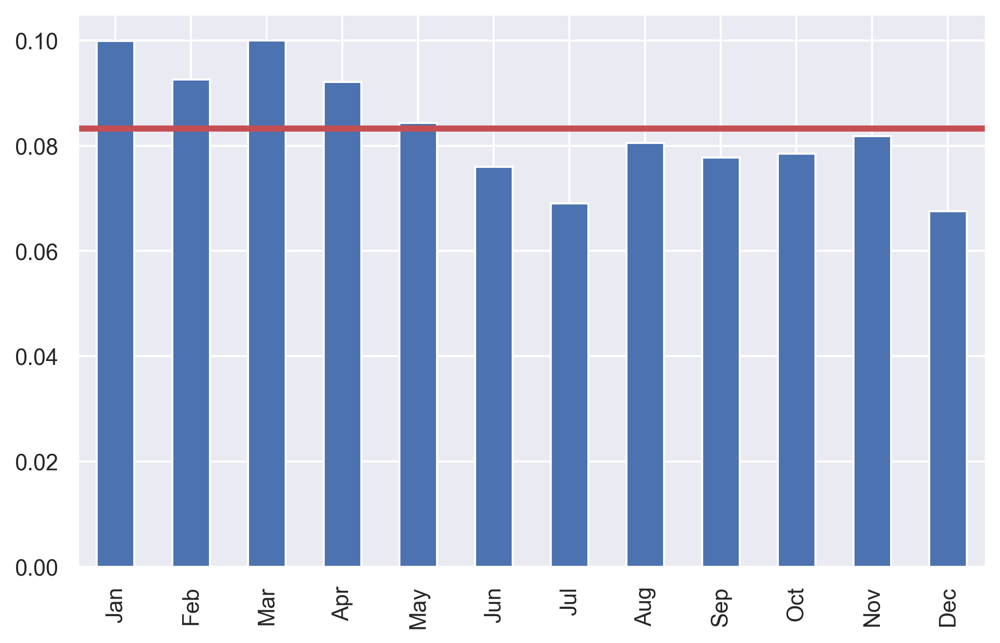

In [172]:
fig1, ax1 = plt.subplots(figsize=(8,5), dpi=300)
ax1.axhline(y=1/12, c="r", lw=3)
monthofyear = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}
norm_loginmonthly = login_data["MONTH"].value_counts().sort_index() / len(login_data.index)
norm_loginmonthly = norm_loginmonthly.rename(index=monthofyear)
norm_loginmonthly.plot(kind="bar", ax=ax1)

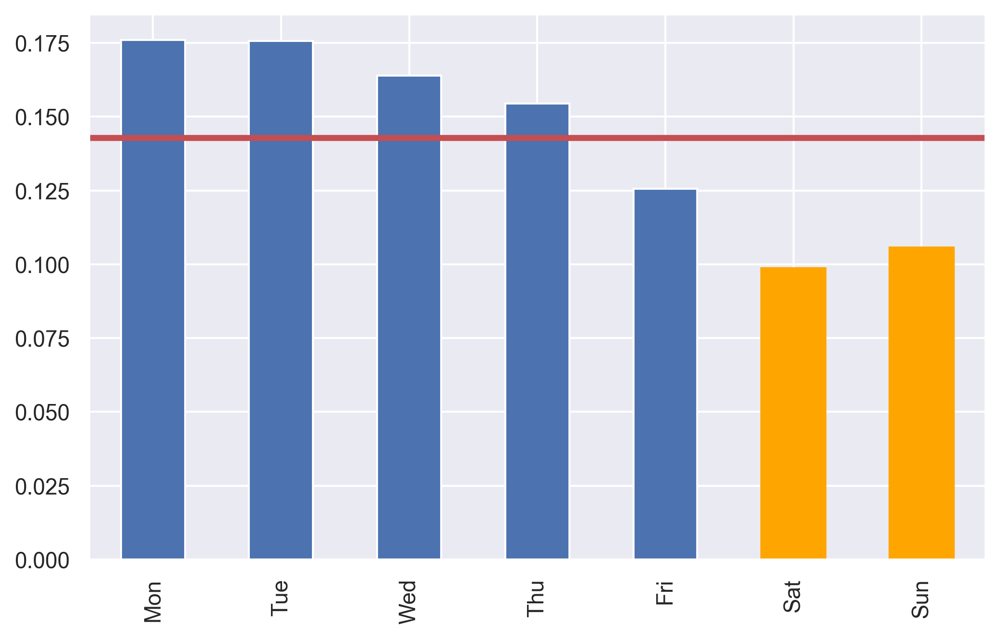

In [175]:
fig2, ax2 = plt.subplots(figsize=(8,5), dpi=300)
ax2.axhline(y=1/7, c="r", lw=3)
dayOfWeek={0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
norm_loginweekly = login_data["DAYOFWEEK"].value_counts().sort_index() / len(login_data.index)
norm_loginweekly = norm_loginweekly.rename(index=dayOfWeek)
norm_loginweekly.plot(kind="bar", ax=ax2)

ax2.get_children()[5].set_color("orange")
ax2.get_children()[6].set_color("orange")

In [176]:
fig1.savefig("../plots/result_plots/logins_overyear.pdf", dpi=300, format='pdf', bbox_inches='tight')
fig2.savefig("../plots/result_plots/logins_overweek.pdf", dpi=300, format='pdf', bbox_inches='tight')

In [146]:
login_data["MONTH"].value_counts().sort_values() / len(login_data.index)

12    0.067509
7     0.069078
6     0.076022
9     0.077773
10    0.078455
8     0.080506
11    0.081811
5     0.084334
4     0.092095
2     0.092551
1     0.099889
3     0.099977
Name: MONTH, dtype: float64

In [6]:
#convert the timedelta columns to floats
customer_data["CONTRACT_DURATION"] = customer_data.apply(lambda x: x.CONTRACT_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["ACTIVE_DURATION"] = customer_data.apply(lambda x: x.ACTIVE_DURATION / pd.Timedelta(days=1), axis=1)
customer_data["VISITS_PER_DAY"] = customer_data.apply(lambda x: x.NUM_VISITS / x.CONTRACT_DURATION, axis=1)

In [7]:
name = "spectral_entropy_results"
freq = "12H"
mode = "cd"
file_ext = ".csv"
spectral_entropy_stats = load_result_data(result_folder + name + "_" + freq + "_" + mode + file_ext) 

In [8]:
spectral_entropy_stats.describe()

,Binary_PowerSpectrumEntropy_window=hann_window_size=28,Binary_WelchEntropy_window=hann_nperseg=256,Timedelta_PowerSpectrumEntropy_window=hann_window_size=7,Timedelta_WelchEntropy_window=hann_nperseg=32
count,138518.000000,138518.000000,133392.000000,133392.000000
mean,0.975542,0.910959,0.928897,0.900645
std,0.023400,0.145441,0.174580,0.181027
min,0.570679,0.000000,0.000000,0.000000
25%,0.967691,0.918425,0.948787,0.903783
50%,0.982556,0.947425,0.966029,0.947879
75%,0.990816,0.971132,0.979399,0.977025
max,0.999978,0.999892,0.999713,0.998716


In [9]:
se_result = prepare_result(customer_data, spectral_entropy_stats)
se_result.describe(percentiles=np.arange(1,10) * 0.1)

,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS,VISITS_PER_DAY,Binary_PowerSpectrumEntropy_window=hann_window_size=28,Binary_WelchEntropy_window=hann_nperseg=256,Timedelta_PowerSpectrumEntropy_window=hann_window_size=7,Timedelta_WelchEntropy_window=hann_nperseg=32
count,138563.000000,138563.000000,138563.000000,138563.000000,138518.000000,138518.000000,133392.000000,133392.000000
mean,611.660592,449.568978,63.952253,0.114485,0.975542,0.910959,0.928897,0.900645
std,551.323127,508.445904,99.670243,0.113991,0.023400,0.145441,0.174580,0.181027
min,30.000000,-19.506111,1.000000,0.000207,0.570679,0.000000,0.000000,0.000000
10%,95.293155,30.000000,4.000000,0.011717,0.947888,0.860017,0.912984,0.836737
20%,155.000000,69.000000,7.000000,0.024847,0.962639,0.908028,0.940901,0.890178
30%,231.331609,115.000000,12.000000,0.040114,0.971787,0.926433,0.954705,0.914324
40%,306.000000,176.000000,19.000000,0.058122,0.977981,0.938701,0.963321,0.932768
50%,425.000000,256.000000,28.000000,0.079296,0.982556,0.947425,0.966029,0.947879
60%,581.331609,375.000000,41.000000,0.105634,0.986291,0.957908,0.971924,0.961080


In [10]:
se_result.corr()

,ISACTIVE,CONTRACT_DURATION,ACTIVE_DURATION,NUM_VISITS,VISITS_PER_DAY,Binary_PowerSpectrumEntropy_window=hann_window_size=28,Binary_WelchEntropy_window=hann_nperseg=256,Timedelta_PowerSpectrumEntropy_window=hann_window_size=7,Timedelta_WelchEntropy_window=hann_nperseg=32
ISACTIVE,1.000000,0.378390,0.264010,0.236973,0.031790,-0.177585,0.065147,0.068471,0.076222
CONTRACT_DURATION,0.378390,1.000000,0.869054,0.527056,-0.096648,-0.312928,0.190576,0.130351,0.146213
ACTIVE_DURATION,0.264010,0.869054,1.000000,0.646870,0.092887,-0.230839,0.236861,0.177185,0.197671
NUM_VISITS,0.236973,0.527056,0.646870,1.000000,0.542762,-0.407503,0.121706,0.154563,0.213376
VISITS_PER_DAY,0.031790,-0.096648,0.092887,0.542762,1.000000,-0.294073,0.068485,0.183015,0.201826
Binary_PowerSpectrumEntropy_window=hann_window_size=28,-0.177585,-0.312928,-0.230839,-0.407503,-0.294073,1.000000,0.139219,-0.084880,-0.078788
Binary_WelchEntropy_window=hann_nperseg=256,0.065147,0.190576,0.236861,0.121706,0.068485,0.139219,1.000000,0.293354,0.262806
Timedelta_PowerSpectrumEntropy_window=hann_window_size=7,0.068471,0.130351,0.177185,0.154563,0.183015,-0.084880,0.293354,1.000000,0.923991
Timedelta_WelchEntropy_window=hann_nperseg=32,0.076222,0.146213,0.197671,0.213376,0.201826,-0.078788,0.262806,0.923991,1.000000


In [1]:
from sklearn.preprocessing import minmax_scale

feature = se_result["Binary_PowerSpectrumEntropy_window=hann_window_size=28"]
#feature = pd.Series(minmax_scale(feature[feature > 0.1]))
fig, ax = plt.subplots(dpi=300)
ax.set_xlabel("Spectral Entropy")
ax.set_ylabel("Number of users")
ax.set_title("Empirical Spectral Entropy Distribution")
#ax.set_yscale("log")
feature.hist(bins=100)
fig.savefig("../plots/result_plots/pse_hist.pdf", dpi=300, format='pdf', bbox_inches='tight')

NameError: name 'se_result' is not defined

In [ ]:
feature = se_result["Binary_WelchEntropy_window=hann_nperseg=256"]
#feature = pd.Series(minmax_scale(feature[feature > 0.1]))
fig, ax = plt.subplots(dpi=300)
ax.set_xlabel("Welch Spectral Entropy")
ax.set_ylabel("Number of users")
ax.set_title("Empirical Welch Spectral Entropy Distribution")
#ax.set_yscale("log")
feature.hist(bins=100)
fig.savefig("../plots/result_plots/wse_hist.pdf", dpi=300, format='pdf', bbox_inches='tight')

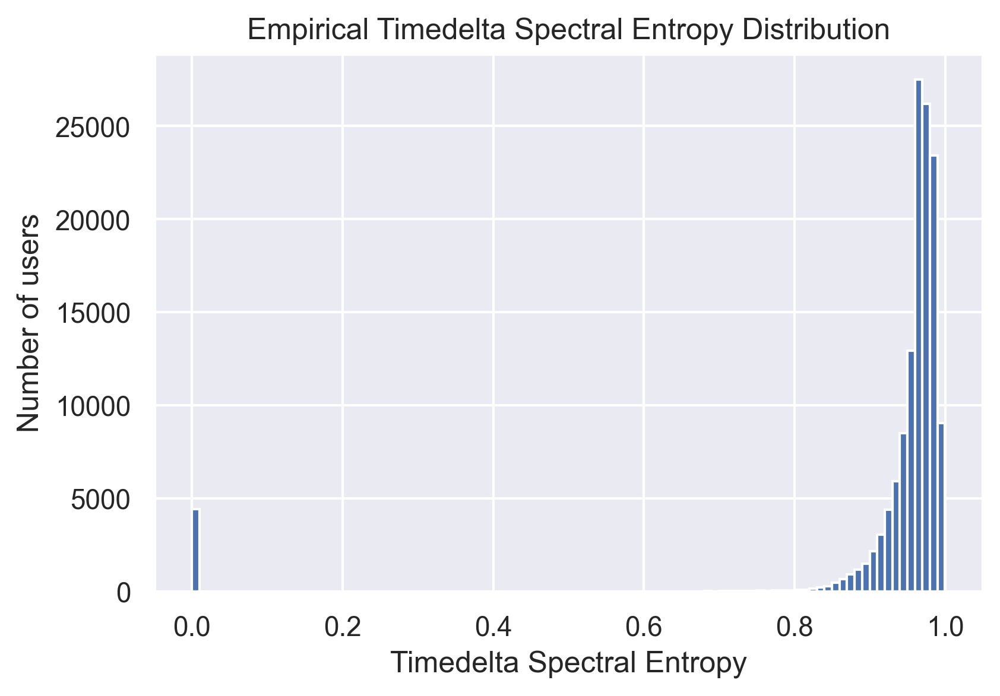

In [141]:
from sklearn.preprocessing import minmax_scale

feature = se_result["Timedelta_PowerSpectrumEntropy_window=hann_window_size=7"]
#feature = feature[se_result.NUM_VISITS > 1]
#feature = pd.Series(minmax_scale(feature[feature > 0.1]))
fig, ax = plt.subplots(dpi=300)
ax.set_xlabel("Timedelta Spectral Entropy")
ax.set_ylabel("Number of users")
ax.set_title("Empirical Timedelta Spectral Entropy Distribution")
#ax.set_yscale("log")
feature.hist(bins=100, ax=ax)
fig.savefig("../plots/result_plots/tdpse_hist.pdf", dpi=300, format='pdf', bbox_inches='tight')

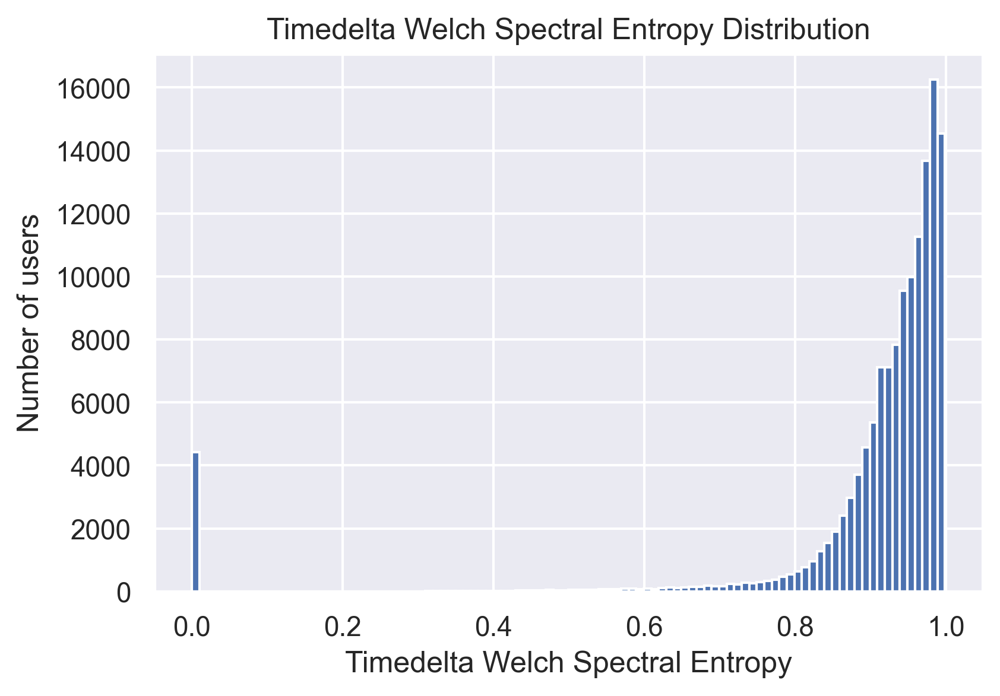

In [142]:
from sklearn.preprocessing import minmax_scale

feature = se_result["Timedelta_WelchEntropy_window=hann_nperseg=32"]
#feature = feature[se_result.NUM_VISITS > 1]
#feature = pd.Series(minmax_scale(feature[feature > 0.1]))
fig, ax = plt.subplots(dpi=300)
ax.set_xlabel("Timedelta Welch Spectral Entropy")
ax.set_ylabel("Number of users")
ax.set_title("Timedelta Welch Spectral Entropy Distribution")
#ax.set_yscale("log")
feature.hist(bins=100, ax=ax)
fig.savefig("../plots/result_plots/tdwse_hist.pdf", dpi=300, format='pdf', bbox_inches='tight')

In [87]:
cd_normalizer = colors.LogNorm(vmin=se_result["CONTRACT_DURATION"].min(), vmax=se_result["CONTRACT_DURATION"].max())
nv_normalizer = colors.LogNorm(vmin=se_result["NUM_VISITS"].min(), vmax=se_result["NUM_VISITS"].max())
vpd_normalizer = colors.LogNorm(vmin=se_result["VISITS_PER_DAY"].min(), vmax=se_result["VISITS_PER_DAY"].max())

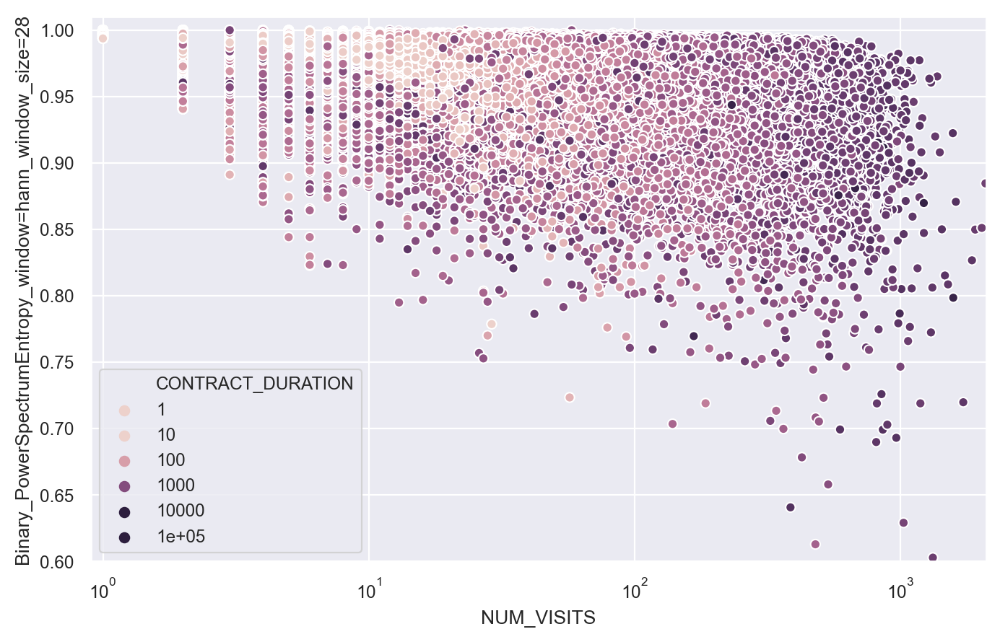

In [122]:
with sns.plotting_context("paper"):
# Initialize figure and ax
    # Set up the matplotlib figure
    fig1, ax1 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax1.set(xscale="log", xlim=(.9,2100), ylim=(0.6,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Binary_PowerSpectrumEntropy_window=hann_window_size=28", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=se_result, ax=ax1, rasterized=True)

In [124]:
# Initialize figure and ax
# Set up the matplotlib figure
#fig_p, ax_p = plt.subplots(figsize=(16,10), dpi=150)

# Set the scale of the x-and y-axes
#ax1.set(xscale="log", xlim=(.9,2100), ylim=(-0.01,1.01))
#sns.scatterplot(x="NUM_VISITS", y="Binary_PowerSpectrumEntropy_window=hann_window_size=28", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=se_result, ax=ax1)

#feature1 = pd.Series(minmax_scale(feature1))

feature1 = se_result["CONTRACT_DURATION"]
feature2 = se_result["Binary_PowerSpectrumEntropy_window=hann_window_size=28"]
#feature2 = pd.Series(minmax_scale(feature2))

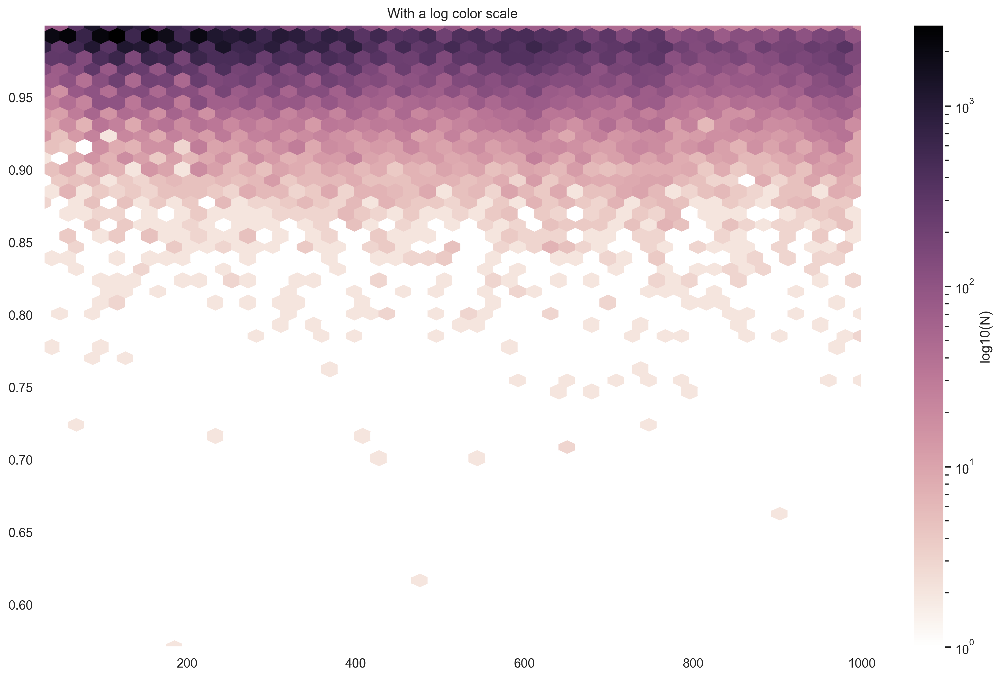

In [125]:
xmin = feature1.min()
xmax = 1000#feature1.max()
ymin = feature2.min()
ymax = feature2.max()
fig, ax = plt.subplots(figsize=(16,10), dpi=300)
hb = ax.hexbin(feature1, feature2, gridsize=50, bins='log', cmap=sns.cubehelix_palette(dark=0, light=1, as_cmap=True), extent=[xmin, xmax, ymin, ymax])
ax.axis([xmin, xmax, ymin, ymax])
ax.set_title("With a log color scale")
cb = fig.colorbar(hb, ax=ax)
cb.set_label('log10(N)')

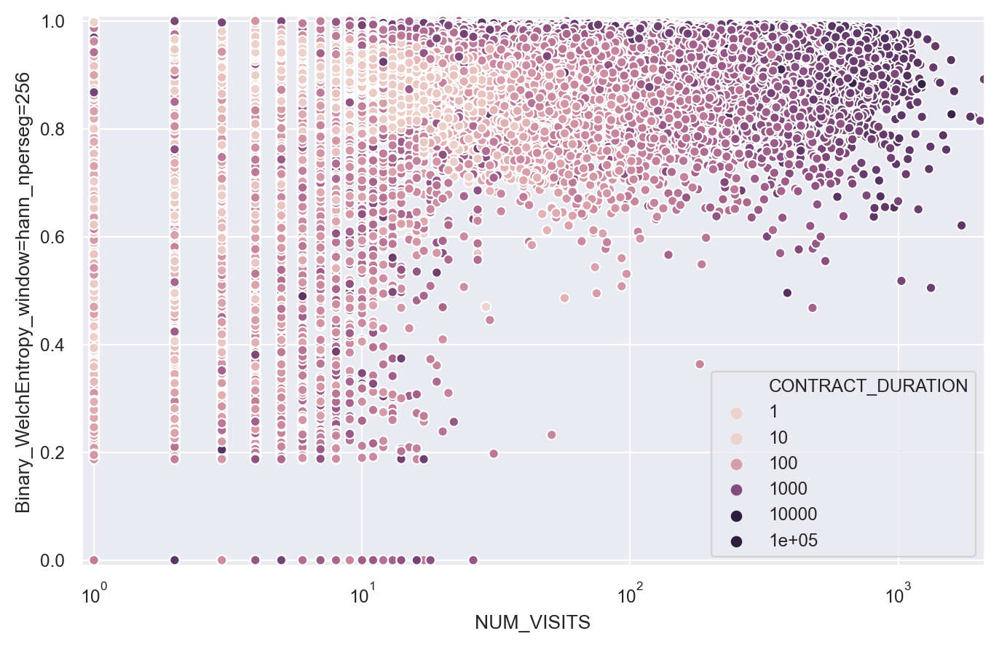

In [128]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig2, ax2 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax2.set(xscale="log", xlim=(.9,2100), ylim=(-0.01,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Binary_WelchEntropy_window=hann_nperseg=256", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=se_result, ax=ax2, rasterized=True)

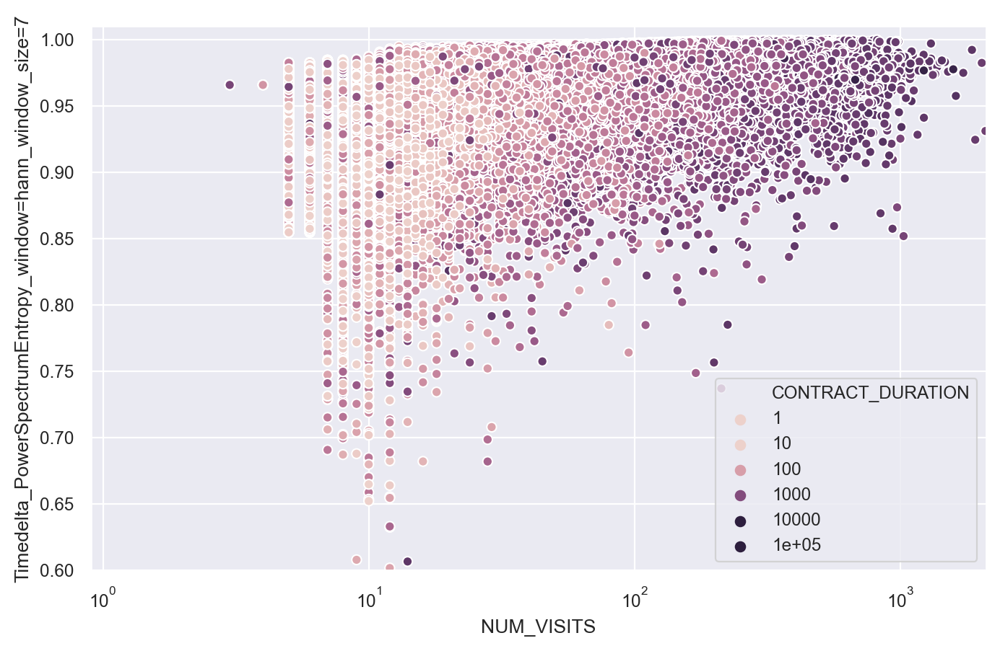

In [129]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig3, ax3 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax3.set(xscale="log", xlim=(.9,2100), ylim=(0.6,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Timedelta_PowerSpectrumEntropy_window=hann_window_size=7", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=se_result, ax=ax3, rasterized=True)

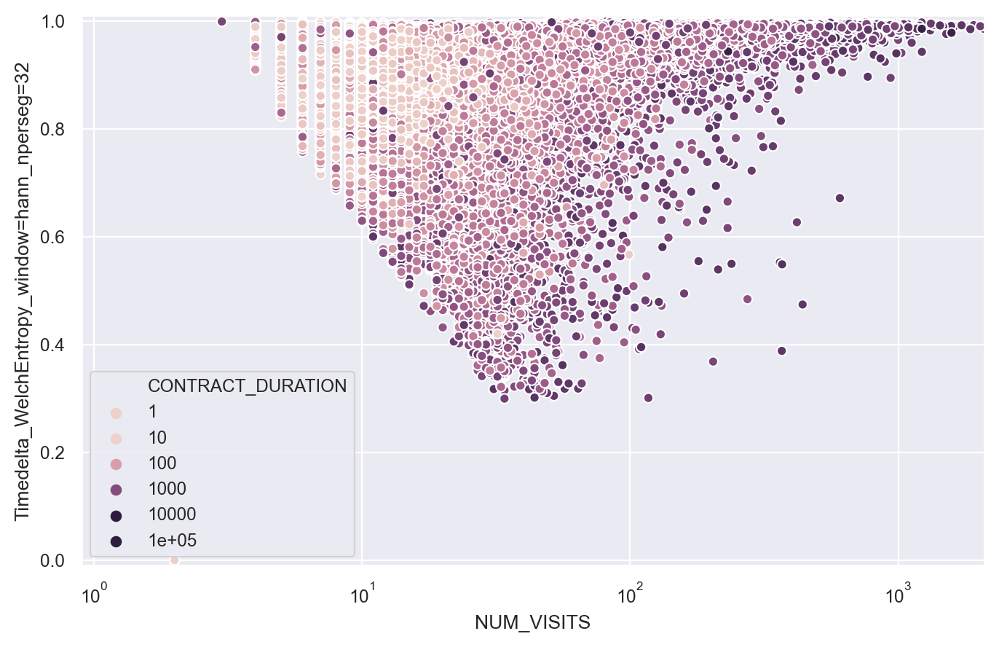

In [130]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig4, ax4 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax4.set(xscale="log", xlim=(.9,2100), ylim=(-0.01,1.01))
    sns.scatterplot(x="NUM_VISITS", y="Timedelta_WelchEntropy_window=hann_nperseg=32", hue="CONTRACT_DURATION", hue_norm=cd_normalizer, data=se_result, ax=ax4, rasterized=True)

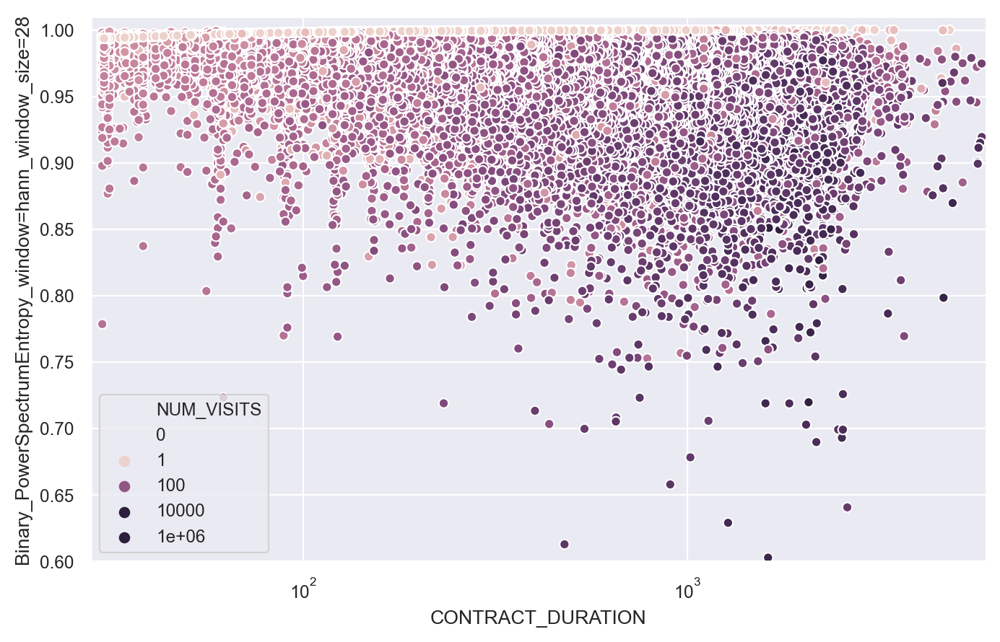

In [131]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig5, ax5 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax5.set(xscale="log", xlim=(28,6000), ylim=(0.6,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Binary_PowerSpectrumEntropy_window=hann_window_size=28", hue="NUM_VISITS", hue_norm=nv_normalizer, data=se_result, ax=ax5, rasterized=True)

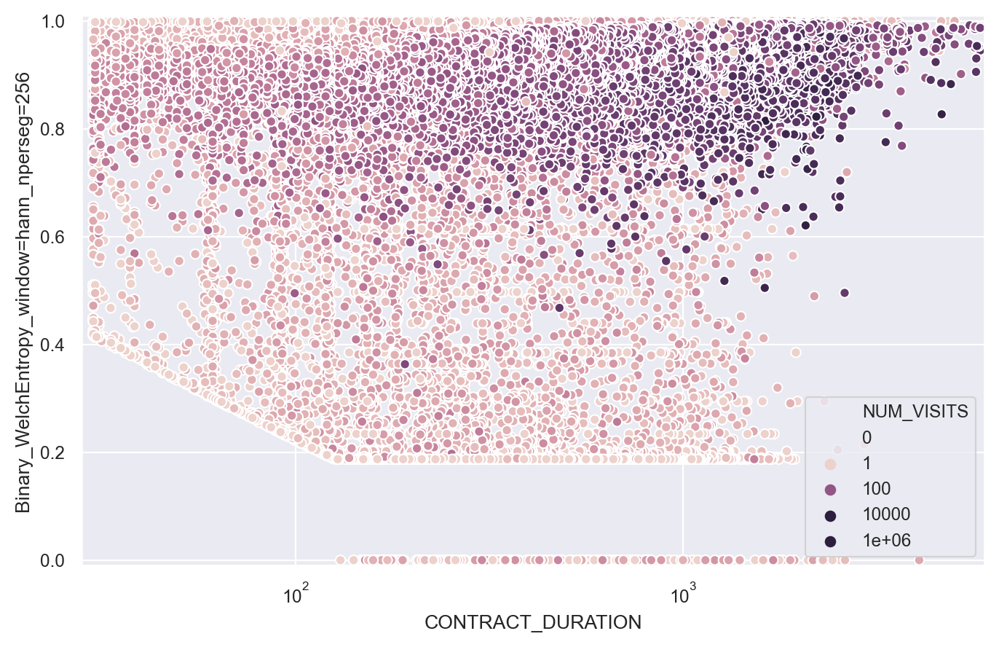

In [132]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig6, ax6 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax6.set(xscale="log", xlim=(28,6000), ylim=(-0.01,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Binary_WelchEntropy_window=hann_nperseg=256", hue="NUM_VISITS", hue_norm=nv_normalizer, data=se_result, ax=ax6, rasterized=True)

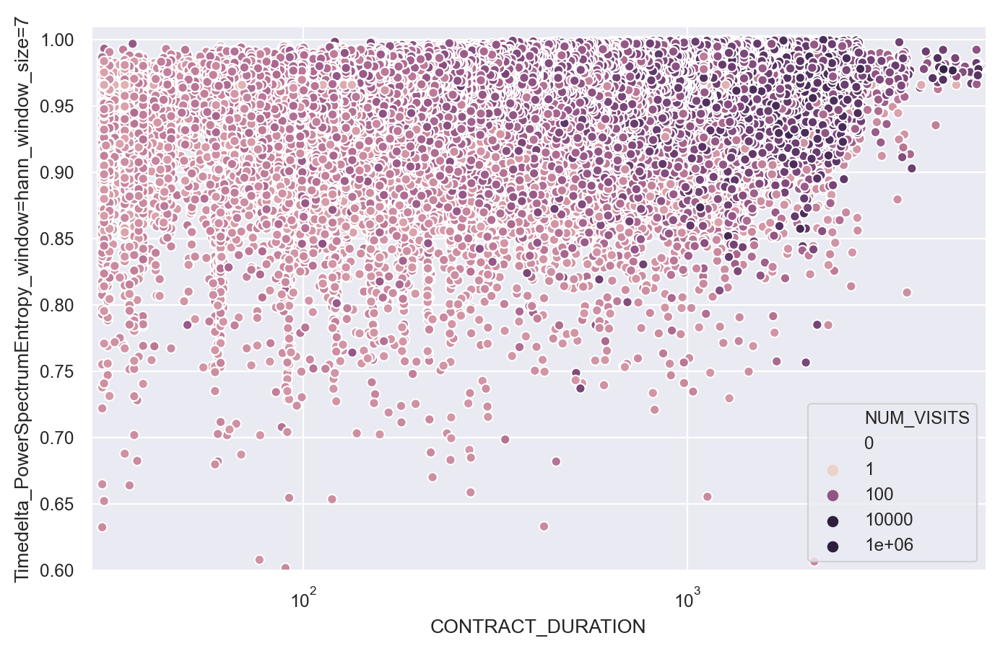

In [133]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig7, ax7 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax7.set(xscale="log", xlim=(28,6000), ylim=(0.6,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Timedelta_PowerSpectrumEntropy_window=hann_window_size=7", hue="NUM_VISITS", hue_norm=nv_normalizer, data=se_result, ax=ax7, rasterized=True)

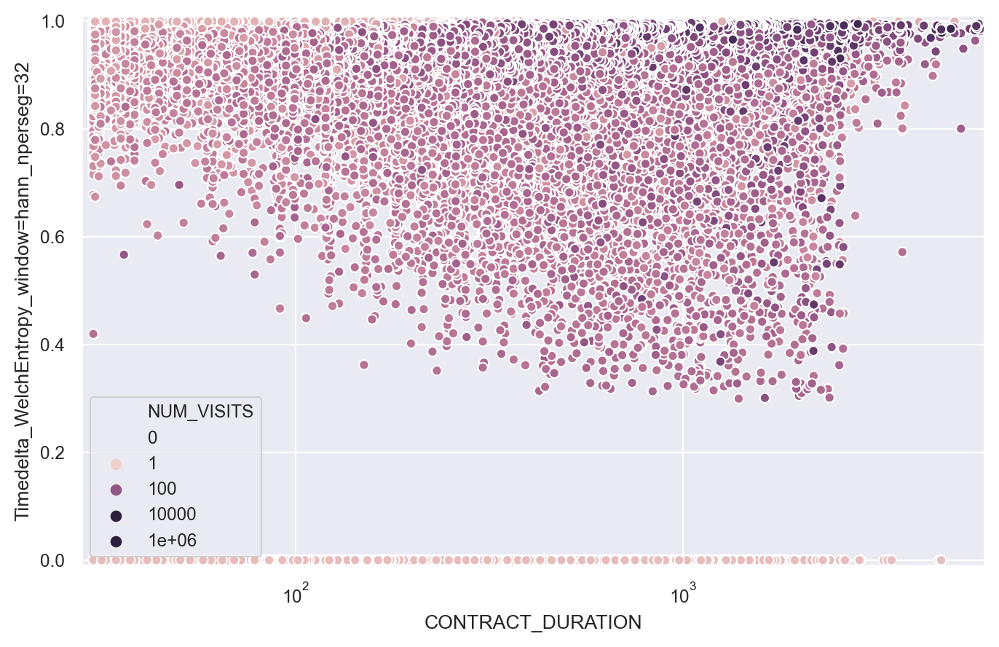

In [134]:
with sns.plotting_context("paper"):
    # Initialize figure and ax
    # Set up the matplotlib figure
    fig8, ax8 = plt.subplots(figsize=(8,5), dpi=200)

    # Set the scale of the x-and y-axes
    ax8.set(xscale="log", xlim=(28,6000), ylim=(-0.01,1.01))
    sns.scatterplot(x="CONTRACT_DURATION", y="Timedelta_WelchEntropy_window=hann_nperseg=32", hue="NUM_VISITS", hue_norm=nv_normalizer, data=se_result, ax=ax8, rasterized=True)

In [135]:
fig1.savefig("../plots/result_plots/pse_nv.pdf", format='pdf', bbox_inches='tight')
fig2.savefig("../plots/result_plots/wse_nv.pdf", format='pdf', bbox_inches='tight')
fig3.savefig("../plots/result_plots/tdpse_nv.pdf", format='pdf', bbox_inches='tight')
fig4.savefig("../plots/result_plots/tdwse_nv.pdf", format='pdf', bbox_inches='tight')
fig5.savefig("../plots/result_plots/pse_cd.pdf", format='pdf', bbox_inches='tight')
fig6.savefig("../plots/result_plots/wse_cd.pdf", format='pdf', bbox_inches='tight')
fig7.savefig("../plots/result_plots/tdpse_cd.pdf", format='pdf', bbox_inches='tight')
fig8.savefig("../plots/result_plots/tdwse_cd.pdf", format='pdf', bbox_inches='tight')

In [123]:
fig1.savefig("../plots/result_plots/pse_nv.pdf", format='pdf', bbox_inches='tight')

In [14]:
stat_name = "Binary_PowerSpectrumEntropy_window=hann_window_size=28"
n = 1000
sample = se_result.nsmallest(n, stat_name).sample(1)
sample_code = sample.index[0]
print(sample[stat_name])
print(sample_code)

2352515.33    0.832647
Name: Binary_PowerSpectrumEntropy_window=hann_window_size=28, dtype: float64
2352515.33


In [15]:
fs = 2.0
classical_config = {"fs": fs, "window": "hann", "window_size": 7*4, "detrend": "constant", "scaling": "density", "mode": "none"}
welch_config = {"fs": fs, "window": "hann", "nperseg": 512, "noverlap": None, "nfft": 1024, "detrend": "constant", "scaling": "density"}

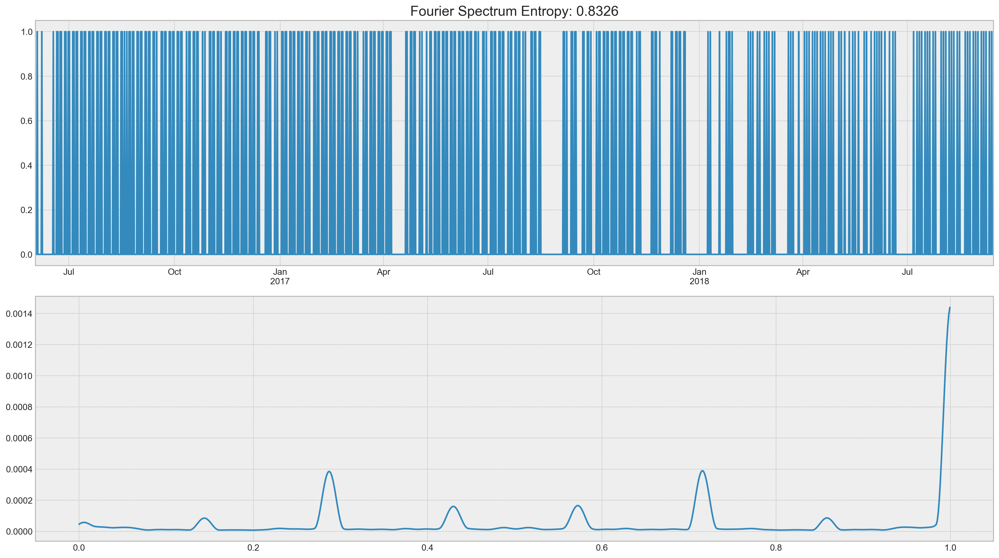

In [22]:
tsplot_periodogram(sample_code, se_result, login_data, stat_name, freq="12H", p_type="classical", **classical_config)
plt.savefig("../plots/result_plots/reg_periodogram.pdf", format='pdf', bbox_inches='tight')

In [17]:
customer_logins = login_data[login_data["CUST_CODE"] == sample_code].sort_values(by="DATE_SAVED")
customer = se_result.loc[sample_code]
bin_series = construct_binary_visit_series(customer, customer_logins, login_data["DATE_SAVED"].max())

In [26]:
bin_series2 = construct_binary_visit_series(customer, customer_logins, login_data["DATE_SAVED"].max(), freq="12H", mode="cd")

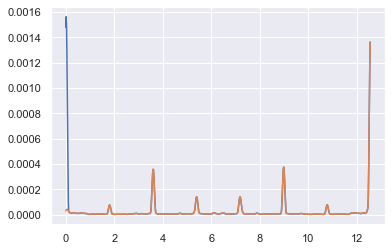

In [27]:
p3 = get_periodogram(bin_series2, window="hann", window_size=14, detrend=False, fs=4, scaling="density")
p4 = get_periodogram(bin_series2, window="hann", window_size=14, detrend="constant", fs=4, scaling="density")
p3.plot()
p4.plot()

In [191]:
from scipy.stats import f
dfn = 2
dfd = len(p4.index) - 3
f_quant = f.ppf(0.95, dfn, dfd)
print(f_quant)

2.9984692065343164


In [192]:
N = len(p4.index)

max_val = p4.max()
max_index = np.argmax(p4.values)

print(max_val)
print(max_index)

print(p4)

0.22846323761175646
1642
0.000000    0.078245
0.000609    0.105061
0.001218    0.126118
0.001828    0.137301
0.002437    0.136436
              ...   
1.997563    0.091248
1.998172    0.113921
1.998782    0.129425
1.999391    0.134447
2.000000    0.127933
Length: 3284, dtype: float64


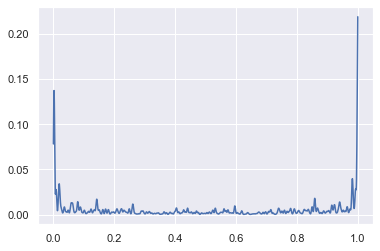

In [193]:
p4[p4.index < 1.0].plot()

In [194]:
print(fourier_spectrum_entropy(p3))
print(fourier_spectrum_entropy(p4))
print(fourier_spectrum_entropy(p4, cutoff=1.0))

0.8931121510457058
0.8953722456915982
0.8844804581577814


count    344.000000
mean       2.416415
std        2.293648
min        0.768507
25%        0.999311
50%        1.997002
75%        3.050877
max       20.003866
dtype: float64

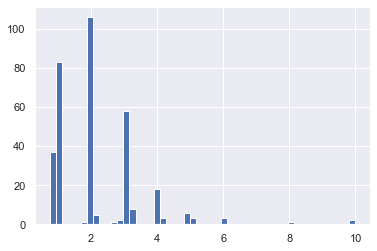

In [19]:

tds = get_timedeltas(customer_logins.DATE_SAVED)
tds[tds < 10].hist(bins=50)
tds.describe()

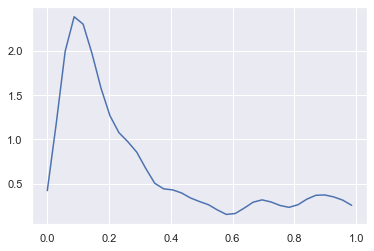

In [90]:
p4 = get_periodogram(tds, window="parzen", window_size=7, detrend="constant", fs=2, scaling="density", mode="none")
p4.plot()

In [59]:
print(fourier_spectrum_entropy(p4))

0.9650436102610148


In [135]:
tds.head(30)

2016-02-07 20:17:45    3.986713
2016-02-08 20:24:11    1.004468
2016-02-11 20:36:05    3.008264
2016-02-12 20:55:56    1.013785
2016-02-14 19:58:21    1.960012
2016-02-17 12:31:37    2.689769
2016-02-21 21:07:12    4.358044
2016-02-22 20:25:41    0.971169
2016-02-23 20:32:57    1.005046
2016-02-25 20:52:23    2.013495
2016-03-01 20:41:27    4.992407
2016-03-06 21:24:26    5.029850
2016-03-13 21:04:34    6.986204
2016-03-14 14:28:13    0.724757
2016-03-17 12:39:39    2.924606
2016-03-18 21:52:57    1.384236
2016-03-19 19:52:39    0.916458
2016-03-21 20:33:52    2.028623
2016-03-22 14:27:35    0.745637
2016-03-24 14:00:07    1.980926
2016-03-28 20:56:15    4.288981
2016-03-29 20:43:33    0.991181
2016-03-30 20:53:11    1.006690
2016-03-31 20:43:27    0.993241
2016-04-02 19:31:24    1.949965
2016-04-03 12:48:49    0.720428
2016-04-04 20:47:48    1.332627
2016-04-13 21:11:35    9.016516
2016-04-14 14:09:23    0.706806
2016-04-15 15:16:39    1.046713
dtype: float64

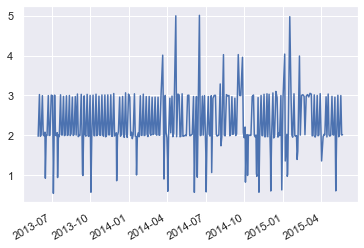

In [190]:
tds.plot()

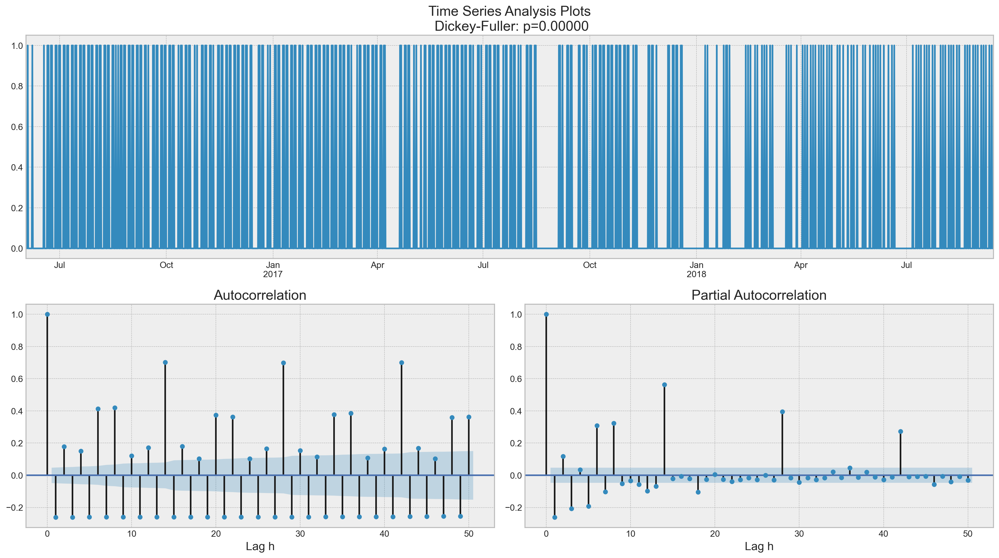

In [29]:
from utils.plot_utils import tsplot

tsplot(bin_series2, lags=50)
plt.savefig("../plots/result_plots/reg_user.pdf", format='pdf', bbox_inches='tight')

In [117]:
args = {"m": 3, "r": 0.2}

max_scale = 30

scales = ["3H", "6H", "12H"] + list(str(i) + "D" for i in range(1, max_scale + 1))

mse = multiscale_entropy(bin_series2, "sampen", scales=scales, **args)

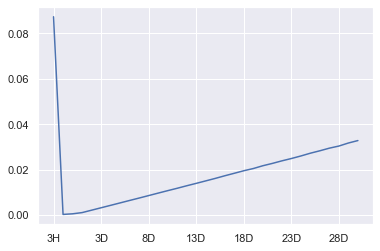

In [118]:
mse.plot()

# Interesting customers 

41694.27 , 8658.10 - good example of Gaussian Mixture Model for timedelta

2100594.28 - multiple strong Dirac comb structures with frequency 1

8124.10 - strong Dirac comb with frequency 1

In [110]:
1/7 * np.log2(7) + 6/7 * np.log2(7/6)

0.5916727785823275